In [1]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [2]:
# pip install git+https://github.com/rwalk/gsdmm.git

In [3]:
from gsdmm import MovieGroupProcess

In [4]:
df = pd.read_csv("pos_neg_india.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,33,33,very surprising that unvaccinated population &...,very surprising that unvaccinated population &...,ENGLISH,very surprising that unvaccinated population &...,ENGLISH,"[('very', 'RB'), ('surprising', 'JJ'), ('that'...","['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37618,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [5]:
df.drop(columns = ['Unnamed: 0', 'Text', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words'], inplace = True)
df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [6]:
df['words_processed_noun'].values[0][0]

'['

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [8]:
tokens_words_processed_noun = list(sent_to_words(df['words_processed_noun']))

In [9]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
high_freq_known_words = ['covid','couid', 'pfizer', 'amp', 'people', 'covidvaccine', 'covishield', 'moderna', 'vaccine', 'vaccinated', 'vaccination', 'vaccines']

stop_list.extend(high_freq_known_words)

test_words_only1 = ['not', 'vaccine', 'covid', 'and', 'vegan', 'cruelty', 'free', 'i', 'use', 'elf', 'cosmetics', 'every', 'day', 'and', 'i', 'love', 'it']
test_stopremoved = [w for w in test_words_only1 if w not in stop_list or w == 'not']
print(test_stopremoved)

['not', 'vegan', 'cruelty', 'free', 'use', 'elf', 'cosmetics', 'every', 'day', 'love']


In [10]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [11]:
df['words_processed_noun'] = tokens_words_processed_noun

In [12]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_noun]
tokenised_stopremoved

[['death'],
 ['hair', 'ply'],
 ['death', 'rate', 'harm', 'harm'],
 ['necessity', 'today', 'scenario', 'problem'],
 ['population',
  'yrs',
  'offline',
  'class',
  'examination',
  'situation',
  'safety',
  'class',
  'examination'],
 ['way', 'thing', 'millennium', 'peril', 'job', 'process', 'retweet'],
 ['symptom', 'example', 'country', 'number', 'death', 'population', 'life'],
 ['follower', 'pledge', 'service', 'humanity'],
 ['case', 'case', 'testing', 'taboo'],
 ['intellectual',
  'education',
  'leader',
  'health',
  'system',
  'pandemic',
  'nation',
  'service'],
 ['agreement', 'student', 'travel', 'guideline'],
 ['system',
  'conversion',
  'appeasement',
  'health',
  'service',
  'infection',
  'rate',
  'death',
  'rate',
  'rate',
  'welfare',
  'isis'],
 ['oppression',
  'yesterday',
  'appointment',
  'wife',
  'today',
  'worker',
  'present',
  'time',
  'money'],
 ['effectiveness',
  'life',
  'number',
  'rajasthan',
  'safetyfirst',
  'thursdayvibe'],
 ['campaign'

In [13]:
df['words_processed_noun'].values[0][0]

'death'

In [14]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [16]:
np.random.seed(0)

In [17]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


In [18]:
df['sentiment'].value_counts()

0    20029
2    17594
Name: sentiment, dtype: int64

In [19]:
negative_df = df[df['sentiment'] == 0]

In [20]:
negative_df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment,tokenised_stopremoved
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],[death],subjective,0,[death]
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","[population, yrs, offline, class, amp, examina...",subjective,0,"[population, yrs, offline, class, examination,..."
7,"under guidance saint gurmeet ram rahim ji, der...","['guidance', 'saint', 'greet', 'ram', 'rahim',...","['follower', 'take', 'pledge', 'get', 'vaccina...","[follower, pledge, couid, vaccination, service...",subjective,0,"[follower, pledge, service, humanity]"
8,bro you know where was case covid detected ind...,"['bro', 'know', 'case', 'couid', 'detected', '...","['case', 'detect', 'fail', 'bring', 'case', 'b...","[case, case, testing, people, vaccination, taboo]",subjective,0,"[case, case, testing, taboo]"
9,your muslim teachers intellectuals boycott cov...,"['muslim', 'teacher', 'intellectual', 'boycott...","['intellectual', 'education', 'top', 'leader',...","[intellectual, education, leader, health, syst...",subjective,0,"[intellectual, education, leader, health, syst..."
...,...,...,...,...,...,...,...
37598,you are right. till today there is no mention ...,"['right', 'till', 'today', 'mention', 'local',...","['right', 'today', 'mention', 'local', 'train'...","[today, train, availability, general_public, t...",subjective,0,"[today, train, availability, general_public, t..."
37601,do we have eat scotch eggs until we are vaccin...,"['eat', 'scotch', 'vaccinate', 'little', 'conf...","['eat', 'scotch', 'vaccinate', 'little', 'conf...","[scotch, lot, emphasis, scotch]",subjective,0,"[scotch, lot, emphasis, scotch]"
37602,it means even if 50% vaccinated lead herd immu...,"['mean', 'even', 'fifty', 'vaccinated', 'lead'...","['mean', 'even', 'vaccinated', 'lead', 'herd_i...","[lead, herd_immunity]",subjective,0,"[lead, herd_immunity]"
37611,that is good decision. even two doses policy j...,"['good', 'decision', 'even', 'two', 'dose', 'p...","['good', 'decision', 'even', 'dose', 'policy',...","[decision, dose, policy, jab, vaccineswork]",subjective,0,"[decision, dose, policy, jab, vaccineswork]"


In [21]:
negative_df['tokenised_stopremoved'].values[0][0]

'death'

In [22]:
negative_tokenised_lemmatized = list(sent_to_words(negative_df['tokenised_stopremoved']))

In [23]:
negative_tokenised_lemmatized[0][0]

'death'

In [24]:
len(negative_tokenised_lemmatized)

20029

In [25]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 4

In [26]:
mgp = MovieGroupProcess(K=4, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 13880 clusters with 4 clusters populated
In stage 1: transferred 10852 clusters with 4 clusters populated
In stage 2: transferred 9430 clusters with 4 clusters populated
In stage 3: transferred 8608 clusters with 4 clusters populated
In stage 4: transferred 7834 clusters with 4 clusters populated
In stage 5: transferred 7246 clusters with 4 clusters populated
In stage 6: transferred 6836 clusters with 4 clusters populated
In stage 7: transferred 6603 clusters with 4 clusters populated
In stage 8: transferred 6418 clusters with 4 clusters populated
In stage 9: transferred 6309 clusters with 4 clusters populated
In stage 10: transferred 6354 clusters with 4 clusters populated
In stage 11: transferred 6339 clusters with 4 clusters populated
In stage 12: transferred 6230 clusters with 4 clusters populated
In stage 13: transferred 6205 clusters with 4 clusters populated
In stage 14: transferred 6206 clusters with 4 clusters populated
In stage 15: transferred 6121 clu

In [27]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [6576 3509 6088 3856]

Most important clusters (by number of docs inside): [0 2 3 1]

Cluster 0 : [('country', 486), ('hospital', 471), ('time', 418), ('government', 416), ('dose', 389), ('day', 333), ('state', 318), ('today', 283), ('govt', 273), ('population', 254)]

Cluster 2 : [('virus', 696), ('case', 460), ('infection', 454), ('death', 414), ('time', 340), ('risk', 293), ('country', 255), ('datum', 238), ('disease', 234), ('year', 222)]

Cluster 3 : [('day', 347), ('student', 298), ('today', 237), ('time', 235), ('school', 224), ('parent', 220), ('fever', 195), ('family', 182), ('kid', 182), ('child', 178)]

Cluster 1 : [('country', 297), ('time', 165), ('travel', 163), ('life', 148), ('government', 146), ('mask', 138), ('day', 103), ('family', 102), ('business', 99), ('money', 95)]


In [28]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [29]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [30]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death]
1,very surprising that unvaccinated population &...,type 3,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 2,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 1,"[intellectual, education, leader, health, syst..."


In [31]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [32]:
result['Topic']

0        type 2
1        type 3
2        type 2
3        type 2
4        type 1
          ...  
20024    type 4
20025    type 3
20026    type 2
20027    type 1
20028    type 2
Name: Topic, Length: 20029, dtype: object

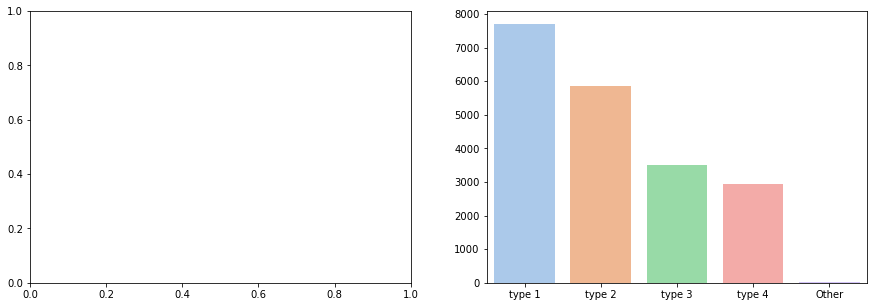

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [34]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death],25
1,very surprising that unvaccinated population &...,type 3,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 2,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 1,"[intellectual, education, leader, health, syst...",33


In [35]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [36]:
result = result.drop('Lemma-text', axis=1)

In [37]:
from wordcloud import WordCloud 

In [38]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

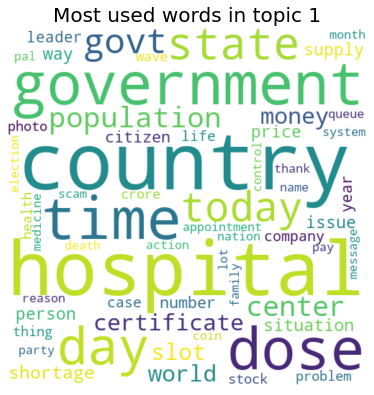

In [39]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

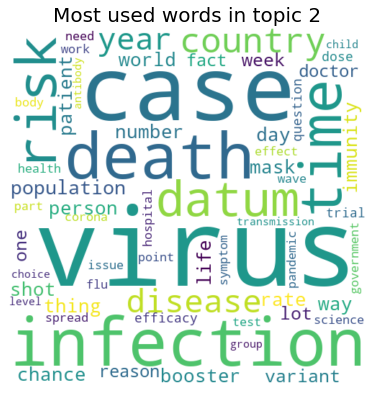

In [40]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

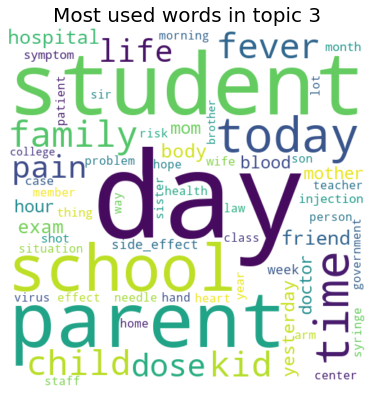

In [41]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

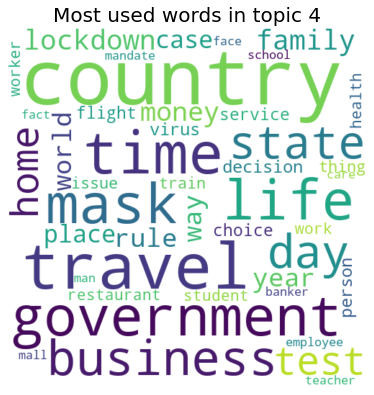

In [42]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

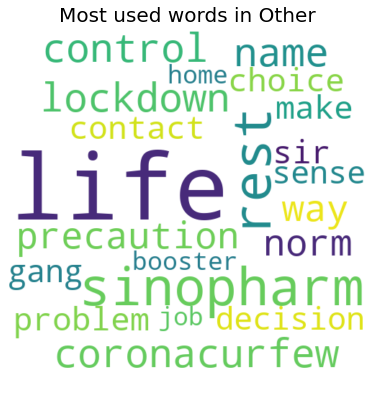

In [43]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 5

In [44]:
mgp = MovieGroupProcess(K=5, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 14902 clusters with 5 clusters populated
In stage 1: transferred 11605 clusters with 5 clusters populated
In stage 2: transferred 10185 clusters with 5 clusters populated
In stage 3: transferred 9135 clusters with 5 clusters populated
In stage 4: transferred 8513 clusters with 5 clusters populated
In stage 5: transferred 7812 clusters with 5 clusters populated
In stage 6: transferred 7491 clusters with 5 clusters populated
In stage 7: transferred 7353 clusters with 5 clusters populated
In stage 8: transferred 7285 clusters with 5 clusters populated
In stage 9: transferred 7121 clusters with 5 clusters populated
In stage 10: transferred 7057 clusters with 5 clusters populated
In stage 11: transferred 6901 clusters with 5 clusters populated
In stage 12: transferred 6785 clusters with 5 clusters populated
In stage 13: transferred 6732 clusters with 5 clusters populated
In stage 14: transferred 6571 clusters with 5 clusters populated
In stage 15: transferred 6542 cl

In [45]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3316  586 5545 4562 6020]

Most important clusters (by number of docs inside): [4 2 3 0 1]

Cluster 4 : [('country', 681), ('government', 475), ('time', 359), ('state', 332), ('population', 297), ('world', 295), ('hospital', 274), ('govt', 268), ('day', 259), ('money', 243)]

Cluster 2 : [('virus', 667), ('infection', 461), ('case', 403), ('death', 386), ('time', 329), ('risk', 282), ('disease', 231), ('datum', 221), ('booster', 198), ('day', 187)]

Cluster 3 : [('day', 390), ('hospital', 365), ('today', 350), ('dose', 330), ('time', 295), ('slot', 197), ('parent', 174), ('fever', 171), ('family', 155), ('center', 152)]

Cluster 0 : [('student', 345), ('school', 252), ('child', 188), ('country', 182), ('life', 175), ('kid', 174), ('travel', 170), ('time', 168), ('case', 154), ('mask', 140)]

Cluster 1 : [('video', 30), ('ahmedabad', 23), ('man', 19), ('case', 16), ('thank', 15), ('cat', 15), ('radar', 13), ('orthodontist', 13), ('fire', 12), ('company',

In [46]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [47]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [48]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death]
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 1,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 2,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 1,"[intellectual, education, leader, health, syst..."


In [49]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [50]:
result['Topic']

0        type 2
1        type 4
2        type 1
3        type 2
4        type 1
          ...  
20024    type 4
20025    type 4
20026    type 2
20027    type 3
20028    type 2
Name: Topic, Length: 20029, dtype: object

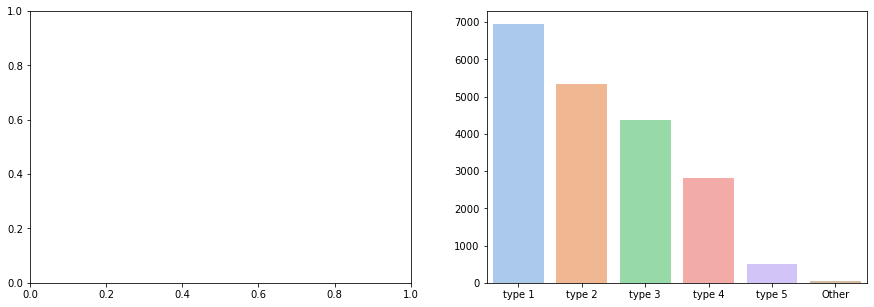

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [52]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death],25
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 1,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 2,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 1,"[intellectual, education, leader, health, syst...",33


In [53]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [54]:
result = result.drop('Lemma-text', axis=1)

In [55]:
from wordcloud import WordCloud 

In [56]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

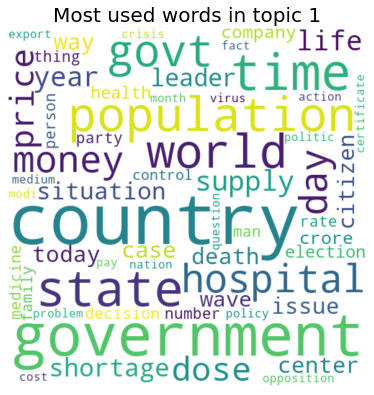

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

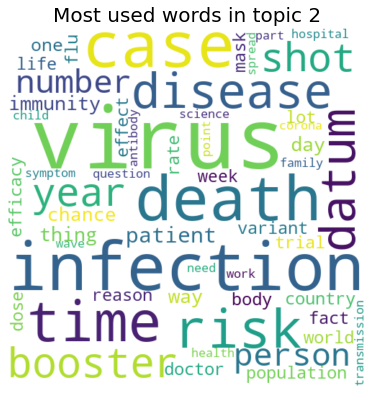

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

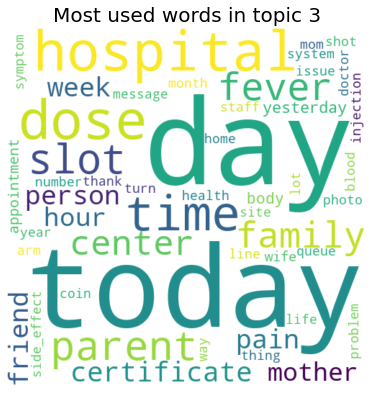

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

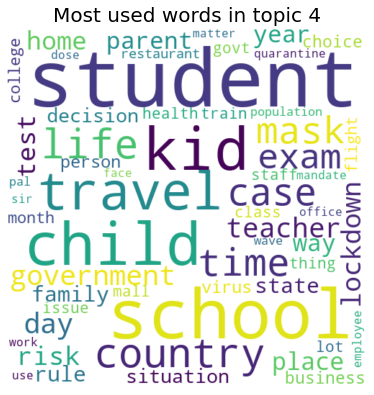

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

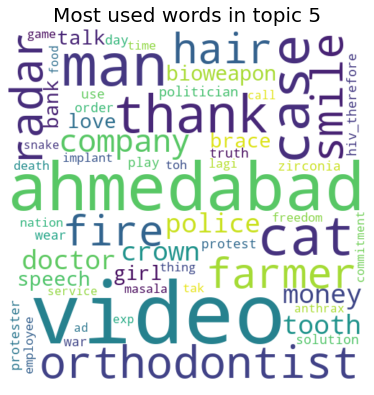

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

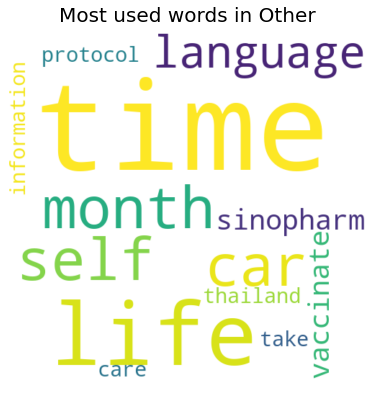

In [62]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 6

In [63]:
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 15501 clusters with 6 clusters populated
In stage 1: transferred 12146 clusters with 6 clusters populated
In stage 2: transferred 10628 clusters with 6 clusters populated
In stage 3: transferred 9511 clusters with 6 clusters populated
In stage 4: transferred 8787 clusters with 6 clusters populated
In stage 5: transferred 8085 clusters with 6 clusters populated
In stage 6: transferred 7870 clusters with 6 clusters populated
In stage 7: transferred 7556 clusters with 6 clusters populated
In stage 8: transferred 7405 clusters with 6 clusters populated
In stage 9: transferred 7213 clusters with 6 clusters populated
In stage 10: transferred 7026 clusters with 6 clusters populated
In stage 11: transferred 6904 clusters with 6 clusters populated
In stage 12: transferred 6879 clusters with 6 clusters populated
In stage 13: transferred 6706 clusters with 6 clusters populated
In stage 14: transferred 6699 clusters with 6 clusters populated
In stage 15: transferred 6511 cl

In [64]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5089  285 1448 6096 3123 3988]

Most important clusters (by number of docs inside): [3 0 5 4 2 1]

Cluster 3 : [('virus', 686), ('infection', 458), ('case', 438), ('death', 414), ('time', 397), ('risk', 296), ('disease', 247), ('datum', 245), ('day', 245), ('booster', 214)]

Cluster 0 : [('country', 536), ('government', 450), ('time', 306), ('state', 296), ('population', 281), ('hospital', 278), ('govt', 273), ('world', 245), ('day', 230), ('money', 229)]

Cluster 5 : [('day', 341), ('dose', 335), ('today', 334), ('hospital', 311), ('time', 243), ('slot', 192), ('fever', 178), ('parent', 167), ('pain', 142), ('mother', 128)]

Cluster 4 : [('student', 355), ('school', 266), ('child', 185), ('kid', 177), ('country', 175), ('travel', 165), ('life', 161), ('time', 154), ('case', 150), ('day', 143)]

Cluster 2 : [('country', 104), ('world', 63), ('certificate', 63), ('photo', 61), ('time', 57), ('virus', 55), ('video', 47), ('election', 46), ('party', 46), (

In [65]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [66]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [67]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 5,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst..."


In [68]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [69]:
result['Topic']

0        type 1
1        type 4
2        type 5
3        type 1
4        type 2
          ...  
20024    type 3
20025    type 6
20026    type 1
20027    type 2
20028    type 1
Name: Topic, Length: 20029, dtype: object

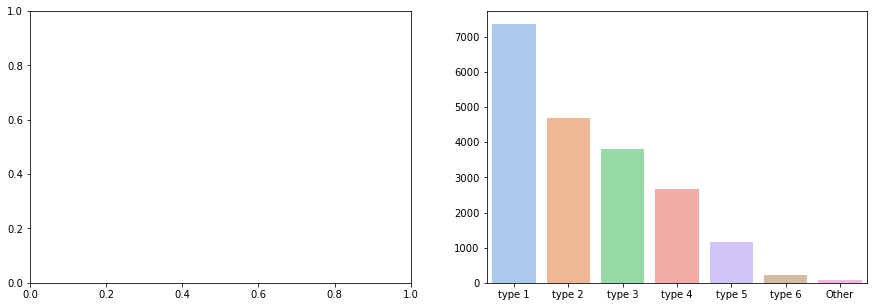

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [71]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 5,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst...",33


In [72]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [73]:
result = result.drop('Lemma-text', axis=1)

In [74]:
from wordcloud import WordCloud 

In [75]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

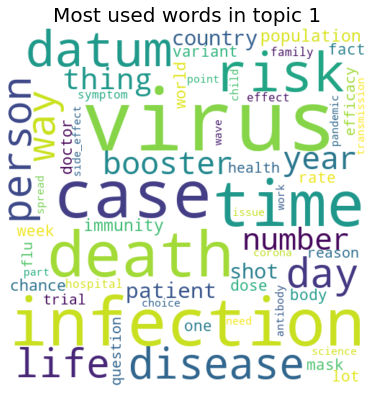

In [76]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

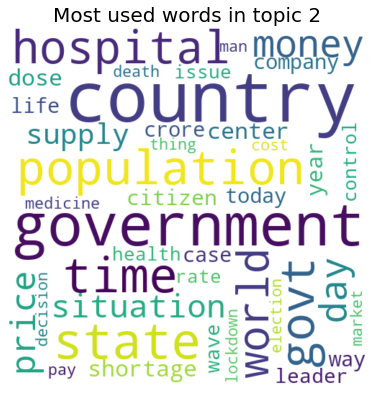

In [77]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

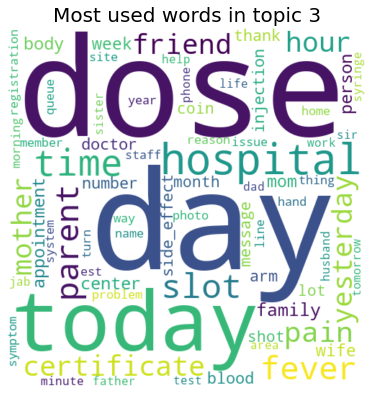

In [78]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

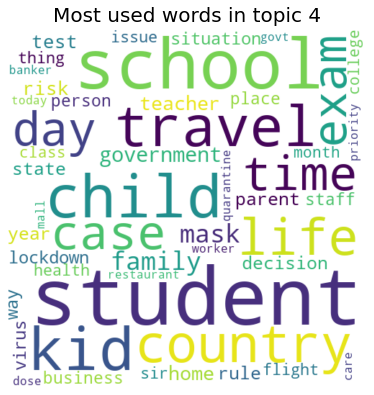

In [79]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

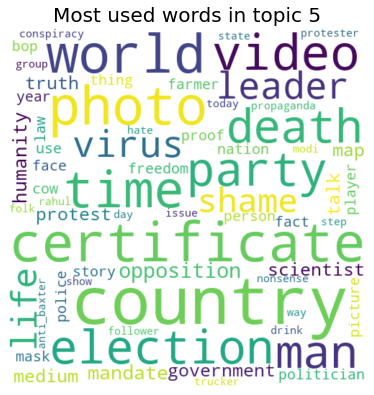

In [80]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

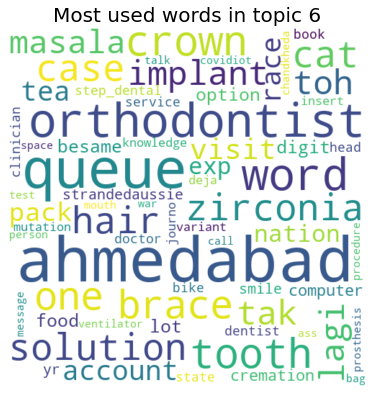

In [81]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

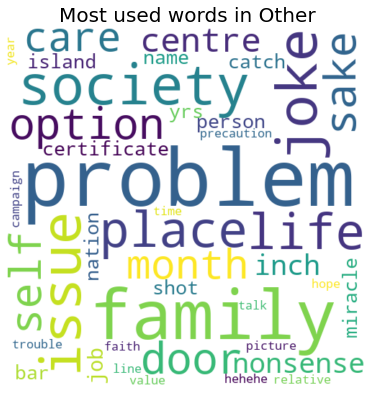

In [82]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [83]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16128 clusters with 7 clusters populated
In stage 1: transferred 12654 clusters with 7 clusters populated
In stage 2: transferred 10919 clusters with 7 clusters populated
In stage 3: transferred 9790 clusters with 7 clusters populated
In stage 4: transferred 8971 clusters with 7 clusters populated
In stage 5: transferred 8484 clusters with 7 clusters populated
In stage 6: transferred 8075 clusters with 7 clusters populated
In stage 7: transferred 7666 clusters with 7 clusters populated
In stage 8: transferred 7445 clusters with 7 clusters populated
In stage 9: transferred 7244 clusters with 7 clusters populated
In stage 10: transferred 7203 clusters with 7 clusters populated
In stage 11: transferred 7164 clusters with 7 clusters populated
In stage 12: transferred 7010 clusters with 7 clusters populated
In stage 13: transferred 6996 clusters with 7 clusters populated
In stage 14: transferred 6925 clusters with 7 clusters populated
In stage 15: transferred 6831 cl

In [84]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4487 1746 2489  322 1088 4197 5700]

Most important clusters (by number of docs inside): [6 0 5 2 1 4 3]

Cluster 6 : [('virus', 656), ('infection', 458), ('case', 424), ('death', 407), ('time', 347), ('risk', 293), ('datum', 243), ('day', 232), ('disease', 222), ('year', 204)]

Cluster 0 : [('hospital', 477), ('dose', 348), ('today', 306), ('time', 300), ('day', 273), ('slot', 231), ('certificate', 226), ('center', 214), ('person', 186), ('parent', 175)]

Cluster 5 : [('country', 494), ('government', 355), ('world', 260), ('state', 245), ('time', 239), ('population', 236), ('money', 214), ('govt', 205), ('price', 180), ('day', 143)]

Cluster 2 : [('country', 270), ('travel', 164), ('mask', 150), ('time', 131), ('test', 108), ('government', 104), ('lockdown', 97), ('way', 85), ('day', 83), ('rule', 82)]

Cluster 1 : [('day', 204), ('fever', 171), ('pain', 142), ('body', 124), ('today', 94), ('time', 91), ('yesterday', 81), ('blood', 79), ('injection', 7

In [85]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [86]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [87]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,very surprising that unvaccinated population &...,type 6,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 3,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 3,"[intellectual, education, leader, health, syst..."


In [88]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [89]:
result['Topic']

0        type 1
1        type 6
2        type 3
3        type 1
4        type 3
          ...  
20024    type 2
20025    type 4
20026    type 1
20027    type 2
20028    type 1
Name: Topic, Length: 20029, dtype: object

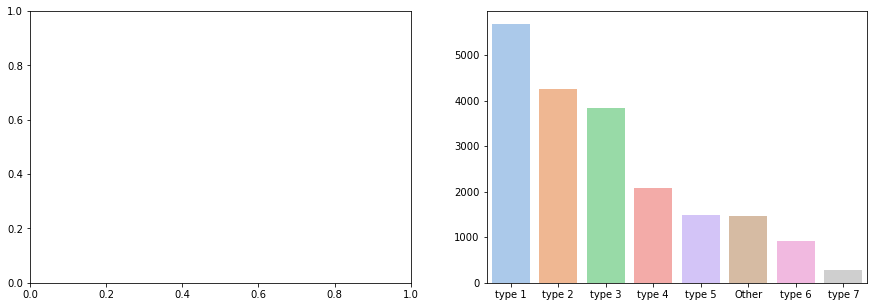

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [91]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,very surprising that unvaccinated population &...,type 6,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 3,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 3,"[intellectual, education, leader, health, syst...",33


In [92]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [93]:
result = result.drop('Lemma-text', axis=1)

In [94]:
from wordcloud import WordCloud 

In [95]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

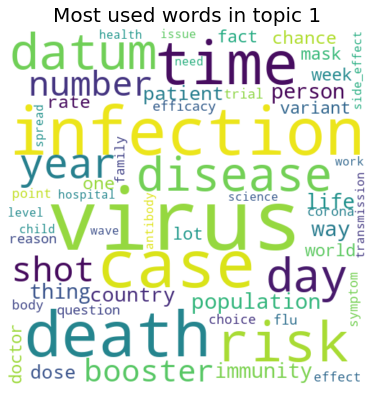

In [96]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

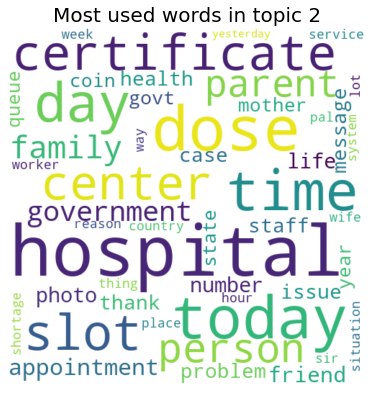

In [97]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

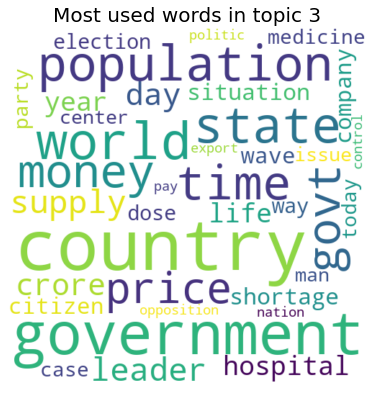

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

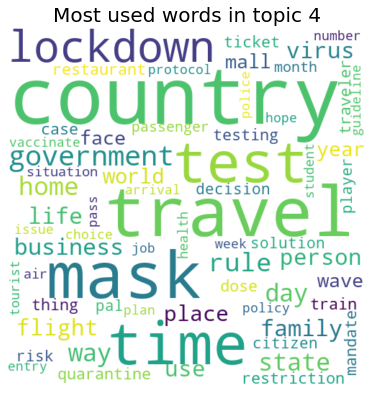

In [99]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

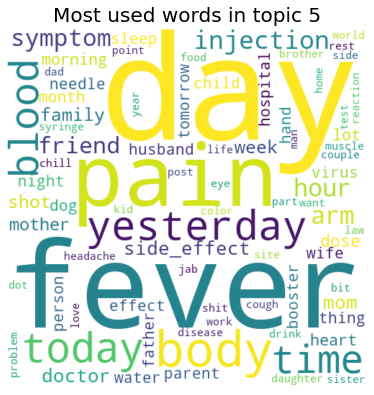

In [100]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

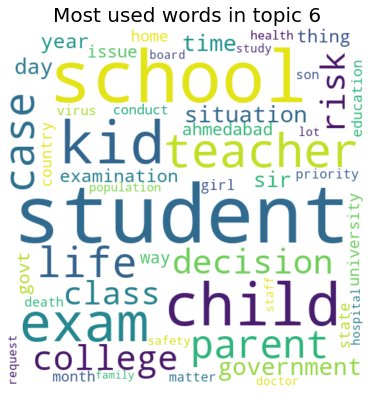

In [101]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

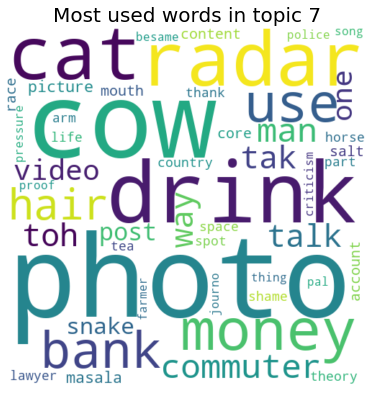

In [102]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

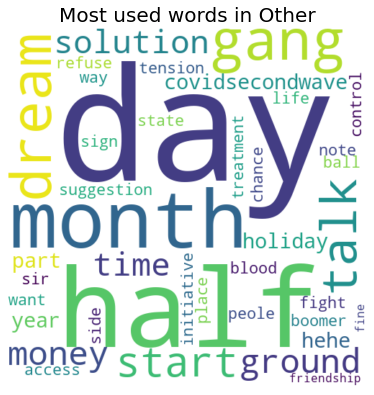

In [103]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [104]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16445 clusters with 8 clusters populated
In stage 1: transferred 13127 clusters with 8 clusters populated
In stage 2: transferred 11475 clusters with 8 clusters populated
In stage 3: transferred 10320 clusters with 8 clusters populated
In stage 4: transferred 9433 clusters with 8 clusters populated
In stage 5: transferred 8793 clusters with 8 clusters populated
In stage 6: transferred 8336 clusters with 8 clusters populated
In stage 7: transferred 8094 clusters with 8 clusters populated
In stage 8: transferred 7704 clusters with 8 clusters populated
In stage 9: transferred 7410 clusters with 8 clusters populated
In stage 10: transferred 7230 clusters with 8 clusters populated
In stage 11: transferred 7139 clusters with 8 clusters populated
In stage 12: transferred 7046 clusters with 8 clusters populated
In stage 13: transferred 7051 clusters with 8 clusters populated
In stage 14: transferred 6842 clusters with 8 clusters populated
In stage 15: transferred 6833 c

In [105]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3748  748 4502 1131 1504 6632 1327  437]

Most important clusters (by number of docs inside): [5 2 0 4 6 3 1 7]

Cluster 5 : [('virus', 722), ('case', 490), ('infection', 473), ('death', 410), ('time', 401), ('risk', 327), ('day', 284), ('country', 263), ('datum', 258), ('disease', 242)]

Cluster 2 : [('hospital', 447), ('today', 338), ('dose', 329), ('time', 290), ('day', 260), ('certificate', 241), ('slot', 216), ('center', 184), ('person', 165), ('family', 161)]

Cluster 0 : [('country', 508), ('government', 354), ('state', 266), ('time', 258), ('population', 234), ('govt', 211), ('money', 206), ('world', 206), ('price', 183), ('day', 170)]

Cluster 4 : [('student', 340), ('school', 244), ('kid', 171), ('child', 161), ('exam', 130), ('life', 117), ('teacher', 104), ('case', 91), ('parent', 81), ('government', 65)]

Cluster 6 : [('leader', 75), ('country', 72), ('world', 66), ('time', 61), ('party', 59), ('election', 56), ('virus', 50), ('opposition',

In [106]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [107]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [108]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 5,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 3,"[intellectual, education, leader, health, syst..."


In [109]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [110]:
result['Topic']

0        type 1
1        type 4
2        type 5
3        type 1
4        type 3
          ...  
20024    type 2
20025    type 6
20026    type 1
20027    type 3
20028    type 1
Name: Topic, Length: 20029, dtype: object

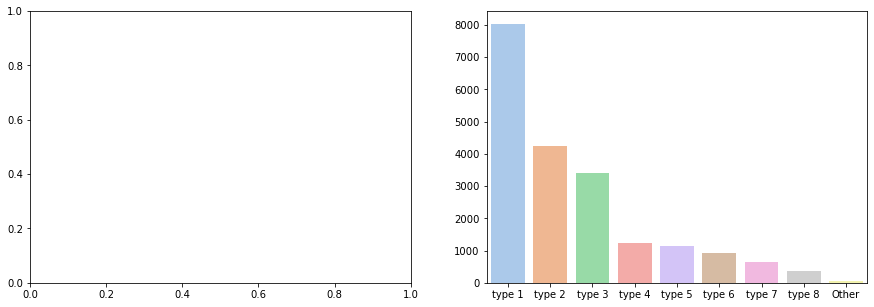

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [112]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,very surprising that unvaccinated population &...,type 4,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 5,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 3,"[intellectual, education, leader, health, syst...",33


In [113]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [114]:
result = result.drop('Lemma-text', axis=1)

In [115]:
from wordcloud import WordCloud 

In [116]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

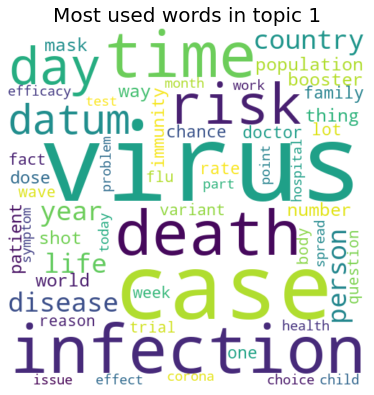

In [117]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

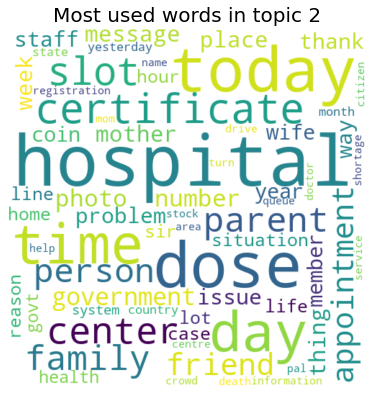

In [118]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

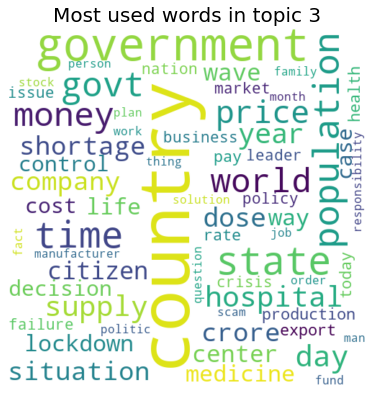

In [119]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

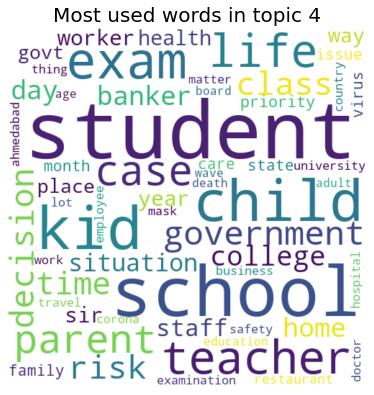

In [120]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

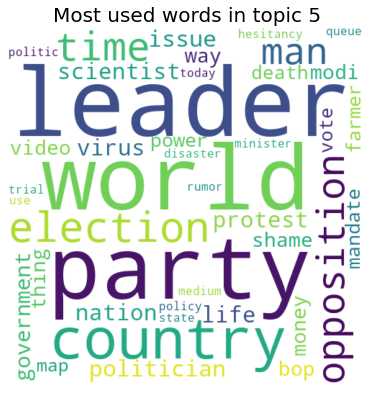

In [121]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

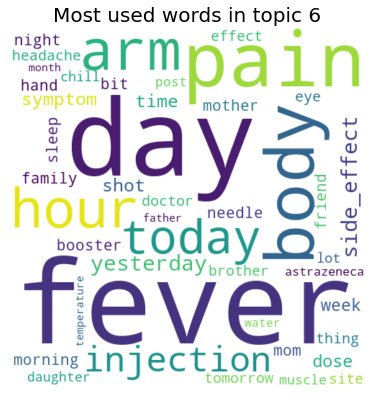

In [122]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

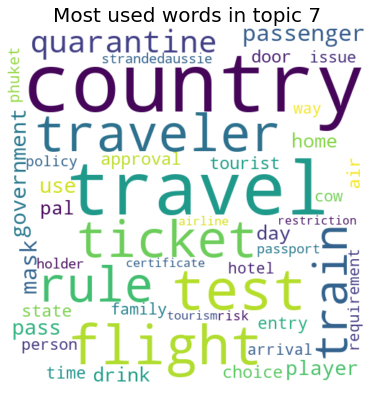

In [123]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

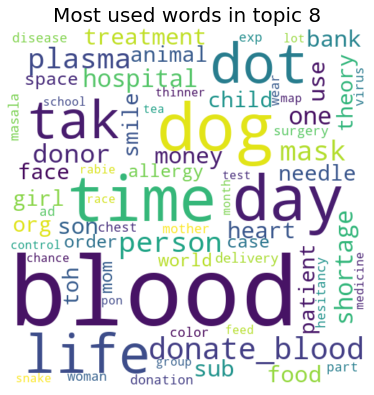

In [124]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

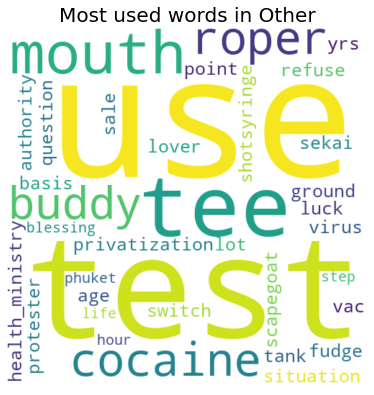

In [125]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [126]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16759 clusters with 9 clusters populated
In stage 1: transferred 13304 clusters with 9 clusters populated
In stage 2: transferred 11588 clusters with 9 clusters populated
In stage 3: transferred 10408 clusters with 9 clusters populated
In stage 4: transferred 9577 clusters with 9 clusters populated
In stage 5: transferred 9108 clusters with 9 clusters populated
In stage 6: transferred 8616 clusters with 9 clusters populated
In stage 7: transferred 8270 clusters with 9 clusters populated
In stage 8: transferred 7925 clusters with 9 clusters populated
In stage 9: transferred 7681 clusters with 9 clusters populated
In stage 10: transferred 7535 clusters with 9 clusters populated
In stage 11: transferred 7323 clusters with 9 clusters populated
In stage 12: transferred 7211 clusters with 9 clusters populated
In stage 13: transferred 7086 clusters with 9 clusters populated
In stage 14: transferred 7043 clusters with 9 clusters populated
In stage 15: transferred 6894 c

In [127]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 899 5801  724  113 5723 4050  300 2195  224]

Most important clusters (by number of docs inside): [1 4 5 7 0 2 6 8 3]

Cluster 1 : [('virus', 701), ('infection', 456), ('case', 441), ('death', 416), ('time', 365), ('risk', 283), ('datum', 246), ('day', 233), ('disease', 224), ('country', 217)]

Cluster 4 : [('country', 731), ('government', 476), ('time', 352), ('state', 340), ('population', 288), ('world', 285), ('day', 255), ('govt', 254), ('money', 235), ('year', 192)]

Cluster 5 : [('hospital', 434), ('dose', 308), ('today', 273), ('time', 241), ('certificate', 225), ('slot', 224), ('day', 221), ('center', 186), ('person', 154), ('appointment', 130)]

Cluster 7 : [('kid', 174), ('family', 164), ('child', 158), ('parent', 152), ('day', 136), ('school', 130), ('friend', 106), ('blood', 104), ('time', 103), ('doctor', 101)]

Cluster 0 : [('fever', 151), ('pain', 132), ('day', 109), ('body', 96), ('arm', 69), ('yesterday', 59), ('today', 58), ('hour', 5

In [128]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [129]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [130]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,very surprising that unvaccinated population &...,type 6,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst..."


In [131]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [132]:
result['Topic']

0        type 1
1        type 6
2        type 2
3        type 1
4        type 2
          ...  
20024    type 3
20025    type 5
20026    type 1
20027    type 1
20028    type 1
Name: Topic, Length: 20029, dtype: object

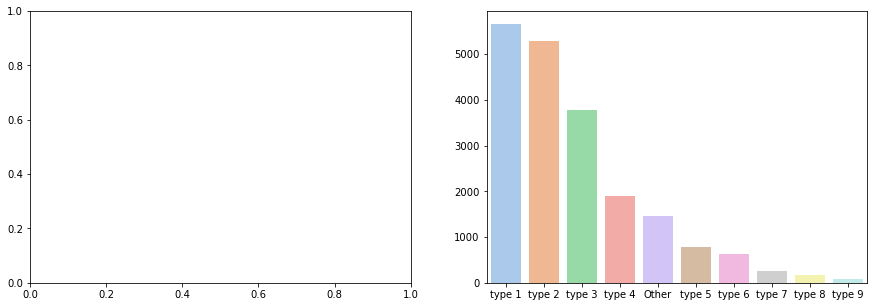

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [134]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,very surprising that unvaccinated population &...,type 6,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst...",33


In [135]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [136]:
result = result.drop('Lemma-text', axis=1)

In [137]:
from wordcloud import WordCloud 

In [138]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

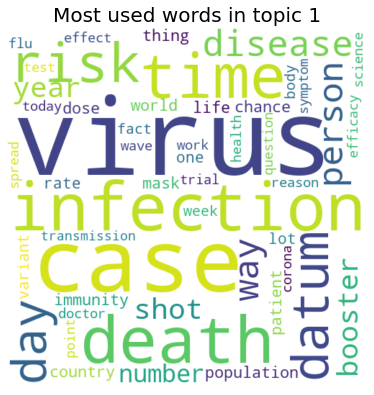

In [139]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

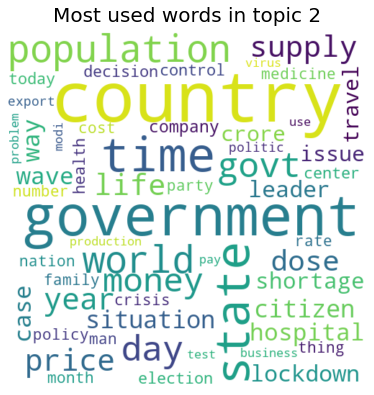

In [140]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

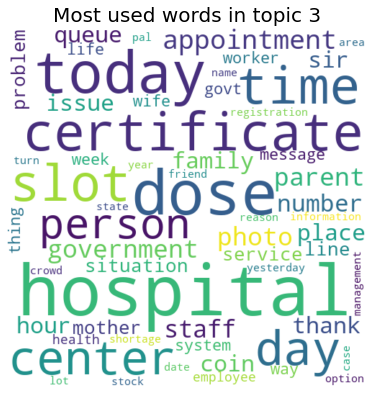

In [141]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

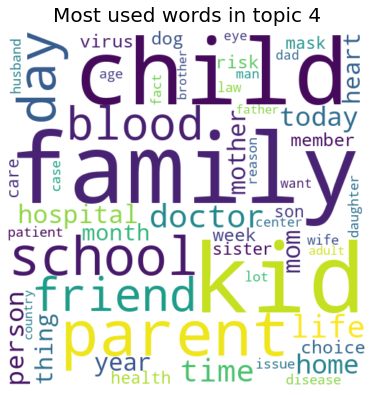

In [142]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

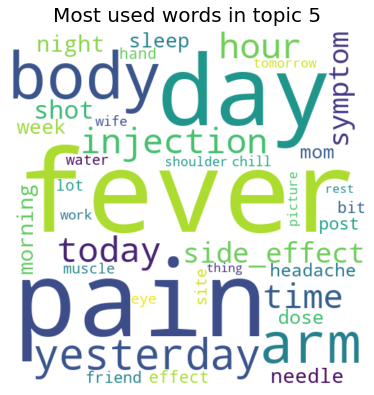

In [143]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

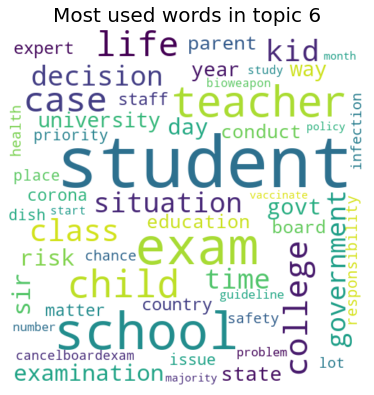

In [144]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

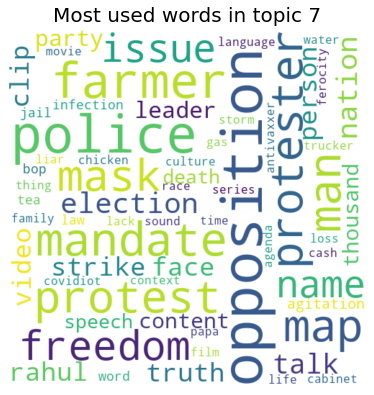

In [145]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

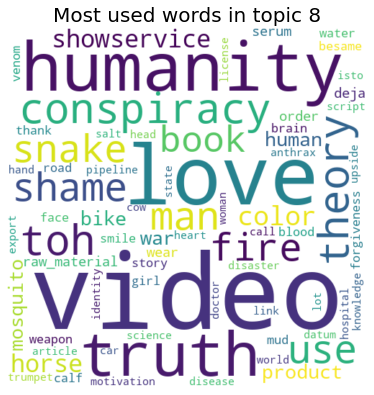

In [146]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

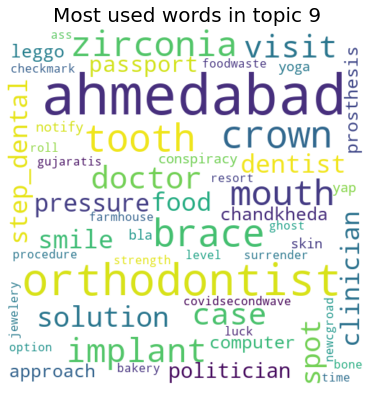

In [147]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

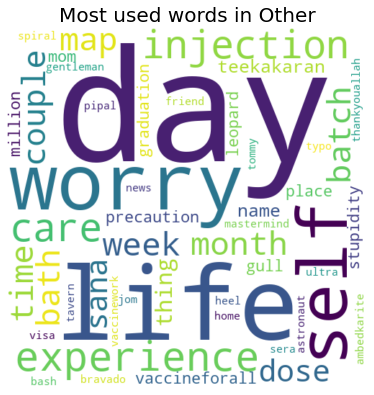

In [148]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [149]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in negative_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(negative_tokenised_lemmatized, n_terms)

In stage 0: transferred 16976 clusters with 10 clusters populated
In stage 1: transferred 13400 clusters with 10 clusters populated
In stage 2: transferred 11650 clusters with 10 clusters populated
In stage 3: transferred 10601 clusters with 10 clusters populated
In stage 4: transferred 9677 clusters with 10 clusters populated
In stage 5: transferred 8851 clusters with 10 clusters populated
In stage 6: transferred 8457 clusters with 10 clusters populated
In stage 7: transferred 8012 clusters with 10 clusters populated
In stage 8: transferred 7636 clusters with 10 clusters populated
In stage 9: transferred 7345 clusters with 10 clusters populated
In stage 10: transferred 7115 clusters with 10 clusters populated
In stage 11: transferred 6939 clusters with 10 clusters populated
In stage 12: transferred 6795 clusters with 10 clusters populated
In stage 13: transferred 6792 clusters with 10 clusters populated
In stage 14: transferred 6685 clusters with 10 clusters populated
In stage 15: tra

In [150]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [1118 2556  450   78  119 4040 5667 5878   95   28]

Most important clusters (by number of docs inside): [7 6 5 1 0 2 4 8 3 9]

Cluster 7 : [('virus', 702), ('infection', 469), ('case', 423), ('death', 407), ('time', 367), ('risk', 294), ('datum', 238), ('disease', 236), ('person', 220), ('day', 214)]

Cluster 6 : [('country', 604), ('government', 421), ('time', 368), ('state', 323), ('population', 304), ('world', 266), ('govt', 260), ('hospital', 250), ('day', 240), ('money', 229)]

Cluster 5 : [('day', 388), ('hospital', 336), ('today', 334), ('dose', 326), ('time', 263), ('slot', 199), ('fever', 179), ('parent', 169), ('pain', 149), ('hour', 139)]

Cluster 1 : [('country', 183), ('travel', 163), ('government', 125), ('mask', 122), ('time', 106), ('test', 91), ('day', 90), ('family', 90), ('home', 87), ('state', 85)]

Cluster 0 : [('student', 300), ('school', 232), ('kid', 176), ('child', 165), ('exam', 133), ('parent', 94), ('teacher', 91), ('life', 8

In [151]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [152]:
def create_topics_dataframe(data_text=negative_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(negative_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [153]:
result = create_topics_dataframe(data_text=negative_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=negative_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,very surprising that unvaccinated population &...,type 5,"[population, yrs, offline, class, examination,..."
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]"
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]"
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst..."


In [154]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [155]:
result['Topic']

0        type 1
1        type 5
2        type 2
3        type 1
4        type 2
          ...  
20024    type 3
20025    type 5
20026    type 1
20027    type 2
20028    type 1
Name: Topic, Length: 20029, dtype: object

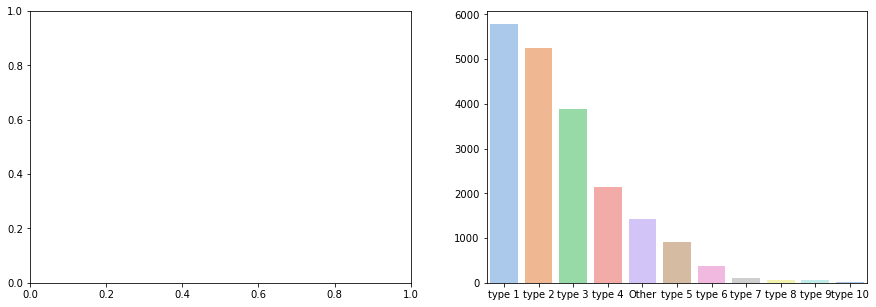

In [156]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [157]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,very surprising that unvaccinated population &...,type 5,"[population, yrs, offline, class, examination,...",36
2,"under guidance saint gurmeet ram rahim ji, der...",type 2,"[follower, pledge, service, humanity]",28
3,bro you know where was case covid detected ind...,type 1,"[case, case, testing, taboo]",36
4,your muslim teachers intellectuals boycott cov...,type 2,"[intellectual, education, leader, health, syst...",33


In [158]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [159]:
result = result.drop('Lemma-text', axis=1)

In [160]:
from wordcloud import WordCloud 

In [161]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

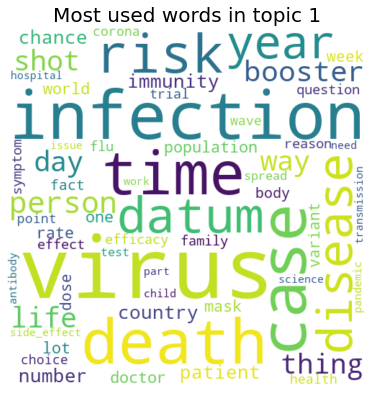

In [162]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

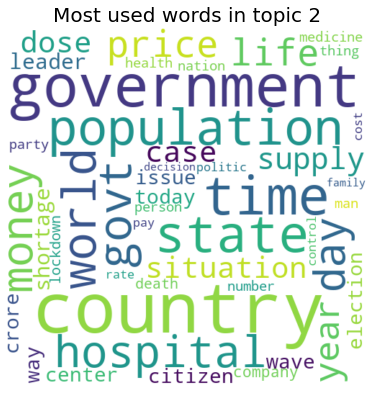

In [163]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

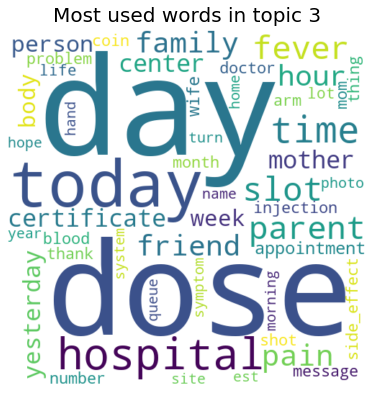

In [164]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

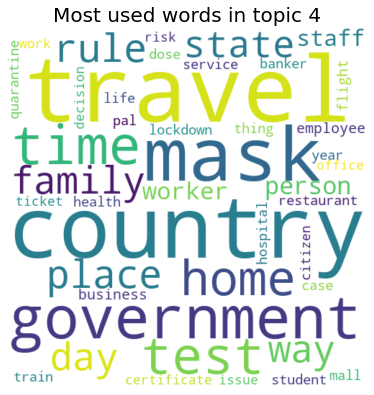

In [165]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

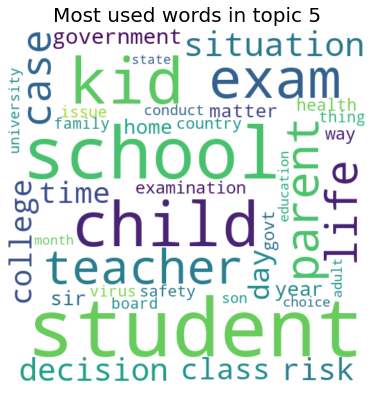

In [166]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

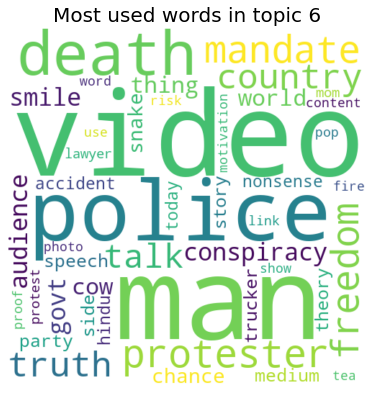

In [167]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

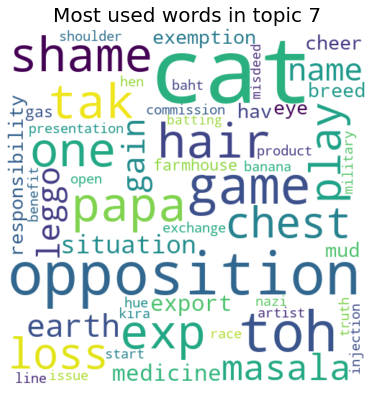

In [168]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

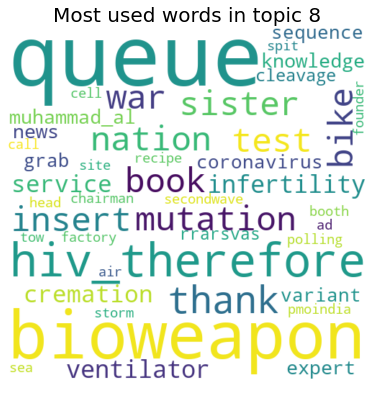

In [169]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

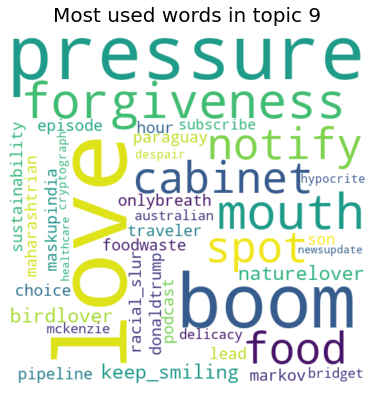

In [170]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

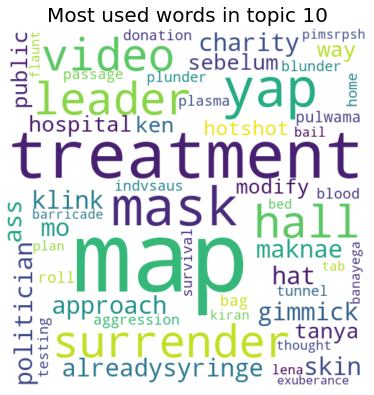

In [171]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 10'], title="Most used words in topic 10")

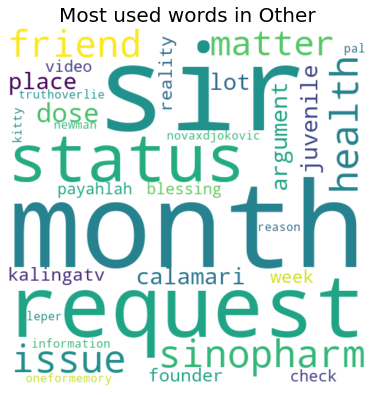

In [172]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")